In [1]:
import os 
from google.colab import drive


# univariate multi-step vector-output stacked lstm example

import numpy as np
from numpy import array
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import GRU, Dropout, BatchNormalization
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from numpy import hstack
from numpy import array
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import datasets, metrics

from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Tensorflow / Keras
from tensorflow import keras # for building Neural Networks
print('Tensorflow/Keras: %s' % keras.__version__) # print version
from keras.models import Sequential # for creating a linear stack of layers for our Neural Network
from keras import Input # for instantiating a keras tensor
from keras.layers import Bidirectional, GRU, RepeatVector, Dense, TimeDistributed # for creating layers inside the Neural Network

# Data manipulation
import pandas as pd # for data manipulation
print('pandas: %s' % pd.__version__) # print version
import numpy as np # for data manipulation
print('numpy: %s' % np.__version__) # print version

# Sklearn
import sklearn
print('sklearn: %s' % sklearn.__version__) # print version
from sklearn.preprocessing import MinMaxScaler # for feature scaling

# Visualization
import matplotlib.pyplot as plt
import plotly 
import plotly.express as px
import plotly.graph_objects as go
print('plotly: %s' % plotly.__version__) # print version
from google.colab import files #import csv file(Dataset) 
files.upload()

Tensorflow/Keras: 2.12.0
pandas: 1.5.3
numpy: 1.22.4
sklearn: 1.2.2
plotly: 5.13.1


Saving A9.csv to A9.csv


{'A9.csv': b'Carbo,Tiempo,Tiempo_F,Insulina,Glucosa,Ingesta\r\nIngesta1,0,0,5.595409758,113.5675993,2000\r\nIngesta1,1,1,5.595409758,113.5680888,2000\r\nIngesta1,2,2,5.595409758,113.5707944,2000\r\nIngesta1,3,3,5.595409758,113.5789833,2000\r\nIngesta1,4,4,5.595409758,113.5971791,2000\r\nIngesta1,5,5,5.595409758,113.6307916,2000\r\nIngesta1,6,6,5.595409758,113.6857729,2000\r\nIngesta1,7,7,5.595409758,113.7683336,2000\r\nIngesta1,8,8,5.595409758,113.884723,2000\r\nIngesta1,9,9,5.595409758,114.0410638,2000\r\nIngesta1,10,10,5.595409758,114.2432321,2000\r\nIngesta1,11,11,5.595409758,114.4967731,2000\r\nIngesta1,12,12,5.595409758,114.8068446,2000\r\nIngesta1,13,13,5.595409758,115.1781826,2000\r\nIngesta1,14,14,5.595409758,115.6150832,2000\r\nIngesta1,15,15,1.395409758,116.1213926,0\r\nIngesta1,16,16,1.395409758,116.7003705,0\r\nIngesta1,17,17,1.395409758,117.3539857,0\r\nIngesta1,18,18,1.395409758,118.0823479,0\r\nIngesta1,19,19,1.395409758,118.8837673,0\r\nIngesta1,20,20,1.395409758,119.75

In [2]:
# READ CSV 
pd.options.display.max_columns=150

# Read in the paciente data csv - keep only the columns we need, in this case: Time, glucose, intake e insulin
df=pd.read_csv('A9.csv', encoding='utf-8', usecols=['Carbo','Tiempo_F','Tiempo','Glucosa','Ingesta','Insulina'])

# Show a snaphsot of data
dfsn=df.copy()


In [3]:
df['Glucosa'] = (df['Glucosa'] - df['Glucosa'].min()) / (df['Glucosa'].max() - df['Glucosa'].min())
df['Insulina'] = (df['Insulina'] - df['Insulina'].min()) / (df['Insulina'].max() - df['Insulina'].min())
print(min(df['Glucosa']))
print(min(df['Glucosa']))
print(max(df['Glucosa']))
print(max(df['Glucosa']))

# Create a copy of an original dataframe
df2=df[['Carbo','Tiempo','Ingesta','Insulina','Glucosa' ]].copy()
df2t=df[['Carbo','Tiempo_F','Ingesta','Insulina','Glucosa' ]].copy()
df2sn=dfsn[['Carbo','Tiempo','Ingesta','Insulina','Glucosa' ]].copy()

# Transpose dataframe 

df2_pivot=df2.pivot(index=['Carbo'], columns='Tiempo')['Glucosa']
df2_pivot1=df2.pivot(index=['Carbo'], columns='Tiempo')['Insulina']
df2_pivot2=df2.pivot(index=['Carbo'], columns='Tiempo')['Ingesta']

df2t_pivot=df2t.pivot(index=['Carbo'], columns='Tiempo_F')['Glucosa']
############################### Transpose dataframe 

df2sn_pivot=df2sn.pivot(index=['Carbo'], columns='Tiempo')['Glucosa']
df2sn_pivot1=df2sn.pivot(index=['Carbo'], columns='Tiempo')['Insulina']
df2sn_pivot2=df2sn.pivot(index=['Carbo'], columns='Tiempo')['Ingesta']

df3=np.transpose(df2_pivot)
df4=np.transpose(df2_pivot1)
##############################
df3sn=np.transpose(df2sn_pivot)
df4sn=np.transpose(df2sn_pivot1)

0.0
0.0
1.0
1.0


In [4]:
# Plot levels of Glucose for each patient!
fig = go.Figure()
for Paciente in df2_pivot.index:
    fig.add_trace(go.Scatter(x=df2_pivot.loc[Paciente, :].index, 
                             y=df2_pivot.loc[Paciente, :].values,
                             mode='lines',
                             name=Paciente,
                             opacity=0.8,
                             line=dict(width=1)
                            ))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'), showlegend=True)

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 title='Date'
                )

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 title='mg'
                )

# Set figure title
fig.update_layout(title=dict(text="Glucose behavior", font=dict(color='black')))

fig.show()

In [5]:
# Plot levels of Glucose for each patient!
fig = go.Figure()
for Paciente in df2t_pivot.index:
    fig.add_trace(go.Scatter(x=df2t_pivot.loc[Paciente, :].index, 
                             y=df2t_pivot.loc[Paciente, :].values,
                             mode='lines',
                             name=Paciente,
                             opacity=0.8,
                             line=dict(width=1)
                            ))

# Change chart background color
fig.update_layout(dict(plot_bgcolor = 'white'), showlegend=True)

# Update axes lines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 title='Date'
                )

fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey', 
                 zeroline=True, zerolinewidth=1, zerolinecolor='lightgrey', 
                 showline=True, linewidth=1, linecolor='black',
                 title='mg'
                )

# Set figure title
fig.update_layout(title=dict(text="Glucose behavior", font=dict(color='black')))

fig.show()

In [6]:
##### split a univariate sequence into samples #################################
def split_sequence(sequence,seq2, n_steps_in, n_steps_out):
	X, I, y = list(),list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out
		# check if we are beyond the sequence
		if out_end_ix > len(sequence):
			break
		# gather input and output parts of the pattern
		seq_x, seq_i, seq_y = sequence[i:end_ix],seq2[i:end_ix], sequence[end_ix:out_end_ix]
		X.append(seq_x)
		I.append(seq_i)
		y.append(seq_y)    
	return array(X), array(I),array(y)
################################################################################
N=38                                                                                         #10% pruebas,60%train 30% Validación
raw_seq = array(np.array(df['Glucosa'][0:480*N])) #de 0 a 480 are all dataa for i intake 
raw_seq2 = array(np.array(df['Insulina'][0:480*N])) 
# choose a number of input and output
n_steps_in, n_steps_out = 15, 430                                                 
# split into samples
X, I, y = split_sequence(raw_seq, raw_seq2, n_steps_in, n_steps_out)
# Concatenar las matrices de glucosa e insulina a lo largo del eje de características
X = np.concatenate((X[:, :, np.newaxis], I[:, :, np.newaxis]), axis=2)
print('shape X =',X.shape)
print('shape X =',y.shape)

#split data test and train.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)
                                         
print('shape X_train =',X_train.shape)
print('shape y_tain =',y_train.shape)
print('shape X_test =',X_test.shape)
print('shape y_test =',y_test.shape)

shape X = (17796, 15, 2)
shape X = (17796, 430)
shape X_train = (12457, 15, 2)
shape y_tain = (12457, 430)
shape X_test = (5339, 15, 2)
shape y_test = (5339, 430)


In [7]:
# Define Number of fetures 
n_features = X.shape[2]   
D=0
U=64
F=5
E=5
B=32     
import datetime
%load_ext tensorboard
# Crear objeto TensorBoard para guardar los registros
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
callbacks = keras.callbacks.EarlyStopping(monitor='loss', patience=4)

# define model  tanh sigmoid relu
model = keras.Sequential()
model.add(GRU(n_steps_in, activation='relu',  recurrent_activation='sigmoid',return_sequences=True, input_shape=(X.shape[1], X.shape[2]))) 
#model.add(Dropout(D))
model.add(GRU(U, activation="relu", recurrent_activation='sigmoid', return_sequences=False))
#model.add(Dropout(D))
model.add(Dense(n_steps_out))
model.compile(optimizer='adam', loss='mae',metrics=['MeanSquaredError','RootMeanSquaredError'])
model.summary()
callbacks = keras.callbacks.EarlyStopping(monitor='loss', patience=4)

# Ejecutar la validación cruzada
kfold = KFold(n_splits=F, shuffle=True)
# Crear una lista para almacenar los objetos de historia
history_list = []
for train, test in kfold.split(X_train, y_train):
  # Ajustar el modelo y almacenar el historial en la lista
  history = model.fit(X_train, y_train, batch_size=B, epochs=E, callbacks=callbacks, verbose=1)
  history_list.append(history)
  # Evaluar el modelo
  scores = model.evaluate(X_test, y_test, verbose=1)
  print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
  print(scores)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 15, 15)            855       
                                                                 
 gru_1 (GRU)                 (None, 64)                15552     
                                                                 
 dense (Dense)               (None, 430)               27950     
                                                                 
Total params: 44,357
Trainable params: 44,357
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5
390/390 [==============================] - 18s 32ms/step - loss: 0.1176 - mean_squared_error: 0.0364 - root_mean_squared_error: 0.1907
Epoch 2/5
390/390 [==============================] - 9s 22ms/step - loss: 0.0887 - mean_squared_error: 0.0253 - root_mean_squared_error: 0.1592
Epoch 3/5
390/390 [========

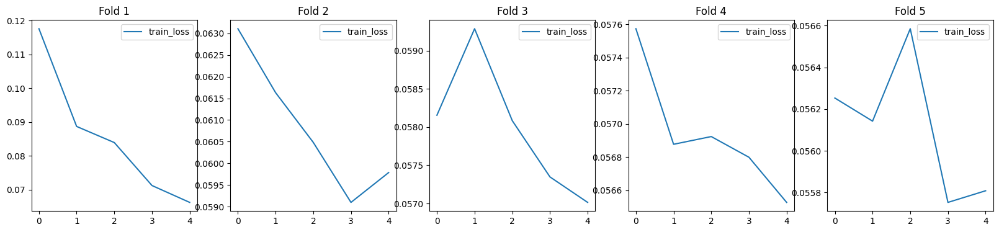

In [8]:
# Graficar las curvas de pérdida y métricas en todas las iteraciones
plt.figure(figsize=(20,4))
for i, history in enumerate(history_list):
  plt.subplot(1, F, i+1)
  plt.plot(history.history['loss'], label='train_loss')
 # plt.plot(history.history['val_loss'], label='val_loss')
  plt.title(f'Fold {i+1}')
  plt.legend()
plt.show()


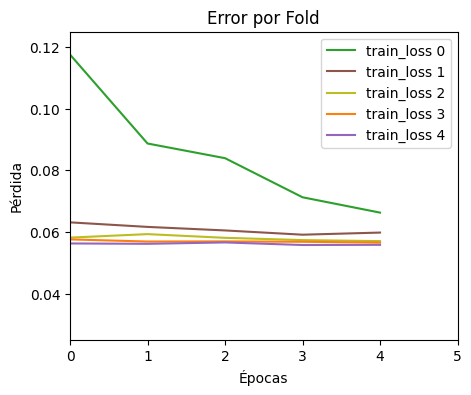

In [11]:
# Graficar las curvas de pérdida y métricas en todas las iteraciones
plt.figure(figsize=(5,4))
for i, history in enumerate(history_list):
  plt.plot(1, F, i+1)
  plt.plot(history.history['loss'], label=('train_loss '+ str(i)))
 # plt.plot(history.history['val_loss'], label='val_loss')
  plt.title('Error por Fold')
  plt.xlim(0, E)
  plt.ylim(0.025, 0.125)
  # Agregar etiquetas a los ejes
  plt.xlabel('Épocas')
  plt.ylabel('Pérdida')
  plt.legend()

plt.show()

In [13]:
model.save("model9.h5")

El área bajo la prediccion es 80846.64
El área bajo la curva real es:  81352.0243771
El error calculado es:  -0.621230701964261 %


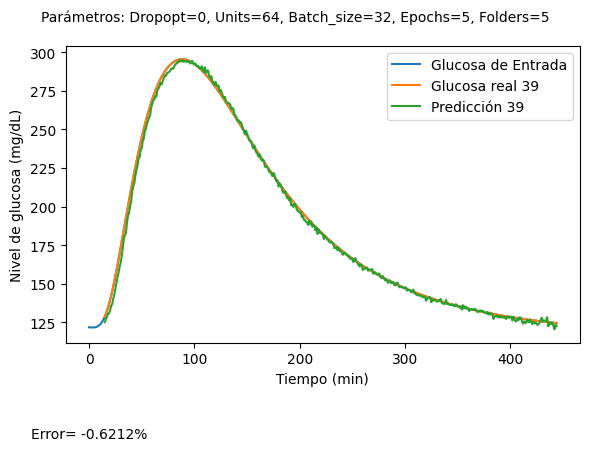

In [12]:
# Define Number of fetures 
n_features = X.shape[2]                                                     

Num_ingesta="39" # Acá defina el número de la ingesta a predecir!
Ingesta="Ingesta"+ Num_ingesta 
xi1=array(np.array(df3[Ingesta][0:n_steps_in]))
xi2=array(np.array(df4[Ingesta][0:n_steps_in]))

#XIN = np.append(xi1, xi2,axis=0)
matriz = np.array(list(zip(xi1,xi2)))
x_input1=matriz.reshape(n_steps_in,2)
x_input = x_input1.reshape((1, n_steps_in, n_features))
yhat = model.predict(x_input, verbose=0)
yhat = (yhat* (dfsn['Glucosa'].max() - dfsn['Glucosa'].min())) + dfsn['Glucosa'].min()

N_grap=n_steps_in
area_p = np.sum(yhat)
print("El área bajo la prediccion es",area_p)
real=np.array(df3sn[Ingesta][N_grap:N_grap+n_steps_out])
area_r=np.sum(real)
print("El área bajo la curva real es: ",area_r)
Err=((area_p-area_r)/area_r)*100
print("El error calculado es: ", Err, "%")

plt.figure(figsize=(6, 4))
plt.plot(array(np.array(df3sn[Ingesta][0:N_grap+n_steps_out])), label='Glucosa de Entrada')                       
plt.plot(range(N_grap,N_grap+n_steps_out),array(np.array(df3sn[Ingesta][N_grap:N_grap+n_steps_out])), label=f'Glucosa real {Num_ingesta}')  
plt.plot(range(N_grap,N_grap+n_steps_out),array(np.array(yhat.reshape(-1,1))), label=f'Predicción {Num_ingesta}')
plt.xlabel("Tiempo (min)") # título del eje x
plt.ylabel("Nivel de glucosa (mg/dL)") # título del eje y
plt.legend()
plt.suptitle(( f"Parámetros: Dropopt={D}, Units={U}, Batch_size={B}, Epochs={E}, Folders={F}"), fontsize=10)
plt.tight_layout() # ajusta el espaciado de la gráfica
plt.text(0, dfsn['Glucosa'].max()*0.15, f"Error= {round(Err, 4)}%", ha='center', va='center')
plt.show()


